In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import nltk
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string

from nltk.stem.wordnet import WordNetLemmatizer
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle
from sklearn.metrics import roc_curve, auc
from nltk.corpus import stopwords
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [85]:
%matplotlib inline

In [67]:
import bokeh.plotting as bp

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import tree

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.metrics import roc_curve, auc

In [3]:
df=pd.read_csv(r"E:\quora insincere  data\train.csv")

In [4]:
df.columns

Index(['qid', 'question_text', 'target'], dtype='object')

In [5]:
df["num_words"] = df["question_text"].apply(lambda x: len(str(x).split()))
df["num_words"] = df["question_text"].apply(lambda x: len(str(x).split()))
df["num_unique_words"] = df["question_text"].apply(lambda x: len(set(str(x).split())))
eng_stopwords = set(stopwords.words("english"))
df["num_stopwords"] = df["question_text"].apply(lambda x: len([w for w in str(x).lower().split() if
w in eng_stopwords]))

In [6]:
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [7]:
stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [8]:
from tqdm import tqdm
from bs4 import BeautifulSoup
preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in tqdm(df['question_text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentance.strip())

100%|██████████████████████████████████████████████████████████████████████| 1306122/1306122 [12:23<00:00, 1756.03it/s]


In [9]:
import warnings
warnings.filterwarnings("ignore")

#### Insincere Question Topic Modelling

In [100]:
y=df['target'][:]
# X=preprocessed_reviews[:]
X=df.drop(['target'], axis = 1) 

X_train, X_test, y_train, y_test = train_test_split(X,y , test_size=0.30, random_state=42)

In [101]:
X_train.columns

Index(['qid', 'question_text', 'num_words', 'num_unique_words',
       'num_stopwords'],
      dtype='object')

In [118]:
X_train.shape

(914285, 5)

In [121]:


# bow = CountVectorizer(analyzer = "word",
#                      ngram_range = (1, 2),
#                      stop_words = "english",
#                      token_pattern = '[a-zA-Z]')
bow=CountVectorizer()
X_train_bow=bow.fit_transform(X_train['question_text'])
X_test_bow=bow.transform(X_test['question_text'])
# print(X_train_bow.shape, y_train.shape)


In [122]:
X_train_bow.shape

(914285, 161675)

In [ ]:
params = {"n_components": [5, 10, 20, 30, 40, 50]}
# we choose a small n_components for time convenient
# will find a appropriate n_components later 
n_topics=8
lda_model = LatentDirichletAllocation(n_components = n_topics,
                                      learning_method = "online",
                                      batch_size = 128,
                                      evaluate_every = -1,
                                      max_iter = 20,
                                      random_state = 32,
                                      n_jobs = -1)

# model = GridSearchCV(lda_model, param_grid = params)
# model.fit(X_train_cv)

# best_lda_model = model.best_estimator_
# best_lda_model
question_topics_train = lda_model.fit_transform(X_train_bow)
# temp = question_topics
# temp = question_topics_train

In [ ]:
question_topics_test = lda_model.transform(X_test_bow)

In [ ]:
lda_model

In [13]:
type(question_topics)

numpy.ndarray

In [90]:
import random

def generate_color():
    color = "#{:02x}{:02x}{:02x}".format(*map(lambda x:       random.randint(0, 255), range(3)))
    return color


colormap = np.array([generate_color() for t in range(n_topics)])
plot_lda = bp.figure(plot_width = 700, plot_height = 600, 
                    title = "LDA topics of Quora Questions",
                    tools = "pan, wheel_zoom, box_zoom, reset, hover, previewsave",
                    x_axis_type = None, y_axis_type = None, min_border = 1)


def create_wordcloud(i, data):
    wc =  WordCloud(max_words = 1000, stopwords = stop_words)
    wc.generate(" ".join(data))
    ax[int(i/2)][i%2].axis("off")
    ax[int(i/2)][i%2].set_title("Words Frequented in Topic {}".format(i), fontsize = 15)
    ax[int(i/2)][i%2].imshow(wc)
    

def bestThresshold(y_train,train_preds):
    tmp = [0,0,0] # idx, cur, max
    delta = 0
    for tmp[0] in tqdm(np.arange(0.1, 0.501, 0.01)):
        tmp[1] = f1_score(y_train, np.array(train_preds)>tmp[0])
        if tmp[1] > tmp[2]:
            delta = tmp[0]
            tmp[2] = tmp[1]
    print('best threshold is {:.4f} with F1 score: {:.4f}'.format(delta, tmp[2]))
    return delta
# delta = bestThresshold(y_train,train_preds)

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
# https://github.com/jupyter/notebook/issues/3523

In [15]:
print("Log Likelihood: {} \nPerplexity: {}".format(lda_model.score(X_train_cv), 
                                                   lda_model.perplexity(X_train_cv)))

Log Likelihood: -282459633.09577817 
Perplexity: 121.44357951958008


In [16]:
# X_train_cv.head()

In [17]:
question_topics = np.matrix(question_topics)
doc_topics = question_topics/question_topics.sum(axis = 1)



In [25]:
tsne_model=TSNE(n_components=2, verbose=1, random_state=32, n_iter=250)
tsne_lda=tsne_model.fit_transform(question_topics)



[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 914285 samples in 4.154s...
[t-SNE] Computed neighbors for 914285 samples in 575.139s...
[t-SNE] Computed conditional probabilities for sample 1000 / 914285
[t-SNE] Computed conditional probabilities for sample 2000 / 914285
[t-SNE] Computed conditional probabilities for sample 3000 / 914285
[t-SNE] Computed conditional probabilities for sample 4000 / 914285
[t-SNE] Computed conditional probabilities for sample 5000 / 914285
[t-SNE] Computed conditional probabilities for sample 6000 / 914285
[t-SNE] Computed conditional probabilities for sample 7000 / 914285
[t-SNE] Computed conditional probabilities for sample 8000 / 914285
[t-SNE] Computed conditional probabilities for sample 9000 / 914285
[t-SNE] Computed conditional probabilities for sample 10000 / 914285
[t-SNE] Computed conditional probabilities for sample 11000 / 914285
[t-SNE] Computed conditional probabilities for sample 12000 / 914285
[t-SNE] Computed conditional proba

[t-SNE] Computed conditional probabilities for sample 234000 / 914285
[t-SNE] Computed conditional probabilities for sample 235000 / 914285
[t-SNE] Computed conditional probabilities for sample 236000 / 914285
[t-SNE] Computed conditional probabilities for sample 237000 / 914285
[t-SNE] Computed conditional probabilities for sample 238000 / 914285
[t-SNE] Computed conditional probabilities for sample 239000 / 914285
[t-SNE] Computed conditional probabilities for sample 240000 / 914285
[t-SNE] Computed conditional probabilities for sample 241000 / 914285
[t-SNE] Computed conditional probabilities for sample 242000 / 914285
[t-SNE] Computed conditional probabilities for sample 243000 / 914285
[t-SNE] Computed conditional probabilities for sample 244000 / 914285
[t-SNE] Computed conditional probabilities for sample 245000 / 914285
[t-SNE] Computed conditional probabilities for sample 246000 / 914285
[t-SNE] Computed conditional probabilities for sample 247000 / 914285
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 468000 / 914285
[t-SNE] Computed conditional probabilities for sample 469000 / 914285
[t-SNE] Computed conditional probabilities for sample 470000 / 914285
[t-SNE] Computed conditional probabilities for sample 471000 / 914285
[t-SNE] Computed conditional probabilities for sample 472000 / 914285
[t-SNE] Computed conditional probabilities for sample 473000 / 914285
[t-SNE] Computed conditional probabilities for sample 474000 / 914285
[t-SNE] Computed conditional probabilities for sample 475000 / 914285
[t-SNE] Computed conditional probabilities for sample 476000 / 914285
[t-SNE] Computed conditional probabilities for sample 477000 / 914285
[t-SNE] Computed conditional probabilities for sample 478000 / 914285
[t-SNE] Computed conditional probabilities for sample 479000 / 914285
[t-SNE] Computed conditional probabilities for sample 480000 / 914285
[t-SNE] Computed conditional probabilities for sample 481000 / 914285
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 702000 / 914285
[t-SNE] Computed conditional probabilities for sample 703000 / 914285
[t-SNE] Computed conditional probabilities for sample 704000 / 914285
[t-SNE] Computed conditional probabilities for sample 705000 / 914285
[t-SNE] Computed conditional probabilities for sample 706000 / 914285
[t-SNE] Computed conditional probabilities for sample 707000 / 914285
[t-SNE] Computed conditional probabilities for sample 708000 / 914285
[t-SNE] Computed conditional probabilities for sample 709000 / 914285
[t-SNE] Computed conditional probabilities for sample 710000 / 914285
[t-SNE] Computed conditional probabilities for sample 711000 / 914285
[t-SNE] Computed conditional probabilities for sample 712000 / 914285
[t-SNE] Computed conditional probabilities for sample 713000 / 914285
[t-SNE] Computed conditional probabilities for sample 714000 / 914285
[t-SNE] Computed conditional probabilities for sample 715000 / 914285
[t-SNE] Computed con

In [26]:
lda_keys = []
for i, tweet in enumerate(X_train_cv):
    lda_keys += [doc_topics[i].argmax()]
    


In [31]:
len(lda_keys)

914285

In [35]:
set(lda_keys)

{0, 1, 2, 3, 4, 5, 6, 7}

In [79]:

import bokeh.plotting as bp
from bokeh.models import HoverTool, BoxSelectTool
from bokeh.models import ColumnDataSource
from bokeh.plotting import figure, show, output_notebook, reset_output
from bokeh.palettes import d3
import bokeh.models as bmo
from bokeh.io import save, output_file
# sources: https://www.kaggle.com/konohayui/topic-modeling-on-quora-insincere-questions

In [44]:
tsne_lda_df = pd.DataFrame(tsne_lda, columns = ["x", "y"])
tsne_lda_df["qid"] = X_train["qid"]
tsne_lda_df["question"] = X_train["question_text"].values
tsne_lda_df["topics"] = lda_keys
tsne_lda_df["topics"] = tsne_lda_df["topics"].map(int)

In [70]:
tsne_lda_df.columns

Index(['x', 'y', 'qid', 'question', 'topics'], dtype='object')

In [86]:
plot_lda = bp.figure(plot_width = 700, plot_height = 600, 
                    title = "LDA topics of Quora Questions",
                    tools = "pan, wheel_zoom, box_zoom, reset, hover, previewsave",
                    x_axis_type = None, y_axis_type = None, min_border = 1)

source = ColumnDataSource(data = dict(x = tsne_lda_df["x"], y = tsne_lda_df["y"],
                         color = colormap[lda_keys],
                         qid = tsne_lda_df["qid"],
                         question = tsne_lda_df["question"],
                         topics = tsne_lda_df["topics"]))

plot_lda.scatter(x = "x", y = "y", color = "color", source = source)
hover = plot_lda.select(dict(type = HoverTool))
hover.tooltips = {"qid": "@qid","question": "@question", "topics": "@topics"}
show(plot_lda)

bokeh.models.renderers.GlyphRenderer(
    id='9a6b8501-7a97-4cc0-b317-a25c7f62763f',
    data_source=bokeh.models.sources.ColumnDataSource(
        id='3051b9d3-e1c6-4b95-a7df-2f5ff9b6f420',
        callback=None,
        data={'topics': [2,
          3,
          3,
          3,
          2,
          2,
          3,
          6,
          2,
          3,
          2,
          3,
          2,
          2,
          2,
          2,
          2,
          2,
          6,
          2,
          2,
          3,
          3,
          3,
          3,
          2,
          3,
          7,
          3,
          3,
          2,
          3,
          3,
          3,
          3,
          2,
          2,
          2,
          2,
          2,
          3,
          3,
          5,
          2,
          2,
          3,
          3,
          2,
          2,
          2,
          3,
          3,
          3,
          3,
          2,
          2,
          2,
          6,
          2,
          2,
          2,
          3,
          2,
          4,
          3,
          2,
          5,
          2,
          3,
          3,
          2,
          2,
          3,
          2,
          2,
          2,
          3,
          6,
          3,
          6,
          5,
          2,
          3,
          2,
          2,
          3,
          3,
          2,
          3,
          2,
          2,
          2,
          2,
          2,
          2,
          2,
          6,
          3,
          3,
          3,
          2,
          3,
          2,
          6,
          2,
          3,
          2,
          2,
          2,
          2,
          2,
          3,
          2,
          2,
          2,
          3,
          3,
          3,
          2,
          3,
          2,
          3,
          2,
          3,
          2,
          3,
          3,
          3,
          3,
          2,
          2,
          3,
          3,
          3,
          2,
          2,
          3,
          3,
          2,
          2,
          3,
          7,
          2,
          2,
          2,
          2,
          2,
          3,
          2,
          3,
          2,
          2,
          2,
          3,
          2,
          2,
          2,
          2,
          3,
          2,
          2,
          6,
          2,
          2,
          2,
          2,
          2,
          3,
          3,
          2,
          2,
          2,
          3,
          3,
          2,
          2,
          3,
          2,
          2,
          2,
          2,
          2,
          2,
          2,
          2,
          3,
          6,
          2,
          3,
          3,
          3,
          2,
          3,
          6,
          2,
          2,
          2,
          2,
          3,
          2,
          3,
          3,
          2,
          5,
          2,
          2,
          3,
          2,
          2,
          7,
          3,
          5,
          3,
          3,
          3,
          3,
          2,
          5,
          3,
          2,
          2,
          1,
          2,
          2,
          2,
          3,
          2,
          2,
          3,
          3,
          3,
          2,
          2,
          3,
          3,
          2,
          6,
          2,
          3,
          2,
          2,
          2,
          3,
          2,
          2,
          2,
          3,
          3,
          2,
          2,
          2,
          2,
          3,
          6,
          3,
          2,
          2,
          2,
          6,
          2,
          3,
          5,
          2,
          2,
          2,
          3,
          6,
          2,
          3,
          3,
          2,
          2,
          2,
          2,
          2,
          5,
          3,
          2,
          3,
          2,
          2,
          5,
          2,
          3,
          3,
          2,
          2,
          2,
          5,
          2,
 

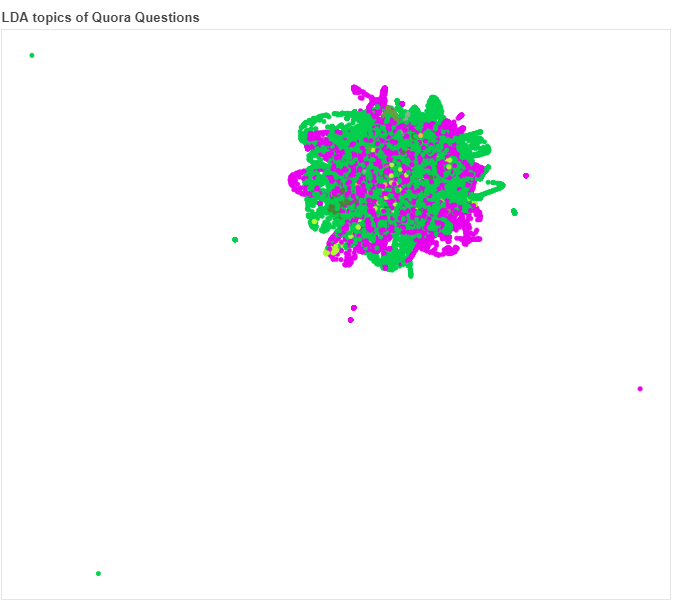

In [89]:
from IPython.display import Image
Image(filename=r'C:\Users\Cyborg\Downloads\bokeh_plot.png') 

In [48]:
tsne_lda_df.columns

Index(['x', 'y', 'qid', 'question', 'topics'], dtype='object')

In [49]:
tsne_lda_df.head()

,x,y,qid,question,topics
0,-0.002599,0.009756,00002165364db923c7e6,How might being submissive be a letdown to a p...,2
1,0.000356,0.006737,000032939017120e6e44,How I can find hide pictures in Redmi 4?,3
2,0.001995,0.010070,NaN,Is there a reason not to say branch?,3
3,0.009056,-0.008637,000042bf85aa498cd78e,"If GST is paid by the consumer, what makes the...",3
4,0.011777,-0.000886,0000455dfa3e01eae3af,Why is Eurostar still the only international r...,2


In [50]:
tsne_lda_df.shape

(914285, 5)

In [52]:
len(y_train)

914285

In [ ]:
# from IPython.display import HTML

# HTML(filename="C:/Users/Cyborg/AppData/Local/Temp/tmp6mjz7h34.html")

In [99]:
threshold = 0.5
idx = np.amax(temp, axis = 1) >= threshold
question_topics = temp[idx]